# APIs

- Connect to a free API 
    - https://github.com/public-apis/public-apis

- Try 3 different APIs 
    - No Auth 
    - API Key 
    - OAuth 

- Check how to run API calls on a schedule 

In [36]:
import requests
import os

## No Auth API

In [37]:

base_url = "https://cat-fact.herokuapp.com"
endpoint = "/facts"

cat_url = base_url+endpoint
print(cat_url)

https://cat-fact.herokuapp.com/facts


In [38]:
response = requests.get(cat_url)
response

<Response [200]>

In [39]:
data = response.json()
cat_fact = data[0]['text']
print(f"Random cat fact of the day:\n{cat_fact}")

Random cat fact of the day:
Owning a cat can reduce the risk of stroke and heart attack by a third.


## API Key

In [49]:
from dotenv import load_dotenv

load_dotenv()
cat_api = cat_api = os.environ["cat_api"]

base_url = "https://api.thecatapi.com"
endpoint = "/v1/images/search"
cat_url = base_url + endpoint
cat_url

'https://api.thecatapi.com/v1/images/search'

In [41]:
params = {"api_key": cat_api, "limit": 15, "has_breeds": 1}
response = requests.get(cat_url, params)
response

<Response [200]>

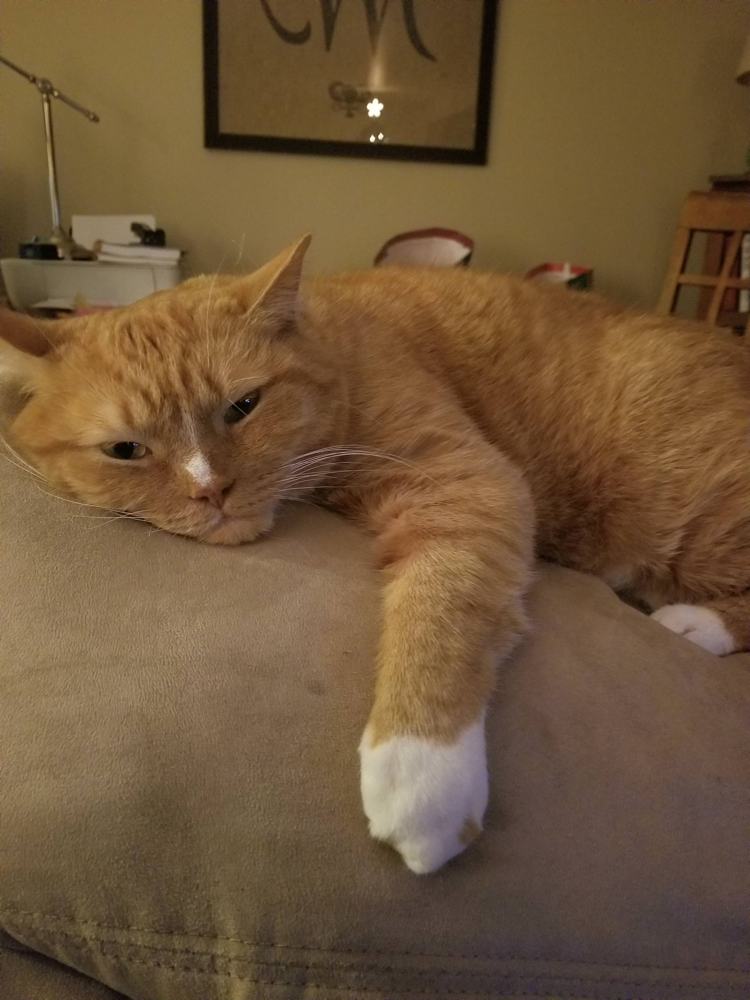

In [46]:
# We have a list with 15 cat objects/dictionaries
data = response.json()

# Pick the cat at the 6th index and take its picture url
cat = data[6]["url"]


# Display a the cat pic with pillow
from PIL import Image

img = Image.open(requests.get(cat, stream=True).raw)
img

## Oauth

In [60]:
# Setting up urls and important keys
client_id = os.environ["spotify_client_id"]
client_secret = os.environ["spotify_client_secret"]

base_url = "https://api.spotify.com"

In [83]:
# Getting an OAuth access token with the client_id and client_secret

params = {
    "grant_type": "client_credentials",
    "client_id": client_id,
    "client_secret": client_secret,
}
head = {"Content-type": "application/x-www-form-urlencoded"}
response = requests.post("https://accounts.spotify.com/api/token", params, headers=head)
access_token = response.json()
#access_token

In [84]:
# Using the OAuth access token to request an artist data
head = {"Authorization": f"Bearer {access_token["access_token"]}"}

response = requests.get(f"{base_url}/v1/artists/4Z8W4fKeB5YxbusRsdQVPb", headers=head)
response.json()

{'external_urls': {'spotify': 'https://open.spotify.com/artist/4Z8W4fKeB5YxbusRsdQVPb'},
 'followers': {'href': None, 'total': 10002858},
 'genres': ['alternative rock',
  'art rock',
  'melancholia',
  'oxford indie',
  'permanent wave',
  'rock'],
 'href': 'https://api.spotify.com/v1/artists/4Z8W4fKeB5YxbusRsdQVPb',
 'id': '4Z8W4fKeB5YxbusRsdQVPb',
 'images': [{'height': 640,
   'url': 'https://i.scdn.co/image/ab6761610000e5eba03696716c9ee605006047fd',
   'width': 640},
  {'height': 320,
   'url': 'https://i.scdn.co/image/ab67616100005174a03696716c9ee605006047fd',
   'width': 320},
  {'height': 160,
   'url': 'https://i.scdn.co/image/ab6761610000f178a03696716c9ee605006047fd',
   'width': 160}],
 'name': 'Radiohead',
 'popularity': 80,
 'type': 'artist',
 'uri': 'spotify:artist:4Z8W4fKeB5YxbusRsdQVPb'}